In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
import matplotlib
import random
import util as u
import plotly.express as px
import pandas as pd
from more_itertools import flatten
from tqdm.notebook import tqdm

In [3]:
loaders = {}
long_names = {}
for path in ("eng_news_2023", "fra_news_2023", "harmful_behaviors", "python", "cpp", "poems"):
    short_name = path[:2]
    long_names[short_name] = path
    loaders[short_name] = u.ActivationLoader(f"activations/{path}")

## Distribution of activation values

In [4]:
cacts1 = {key: u.cat_acts(loaders[key], list(range(0, 100))) for key in tqdm(loaders)}
keys = list(cacts1.keys())

  0%|          | 0/6 [00:00<?, ?it/s]

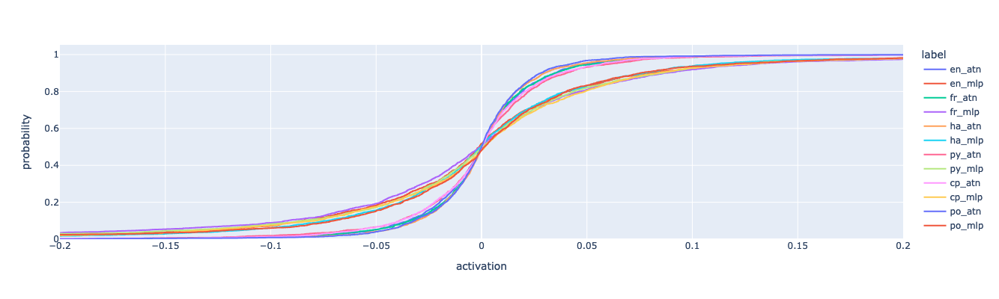

In [5]:
nsamples = 2000
df = u.arrays_to_labelled_df(
    {
        f"{c}_{t}": u.sample_from_tensor(cacts1[c][i], nsamples)
        for c in keys
        for i, t in enumerate(["atn", "mlp"])
    },
    "activation",
)
px.ecdf(df, x="activation", color="label").update_layout(xaxis_range=[-0.2, 0.2], height=400)

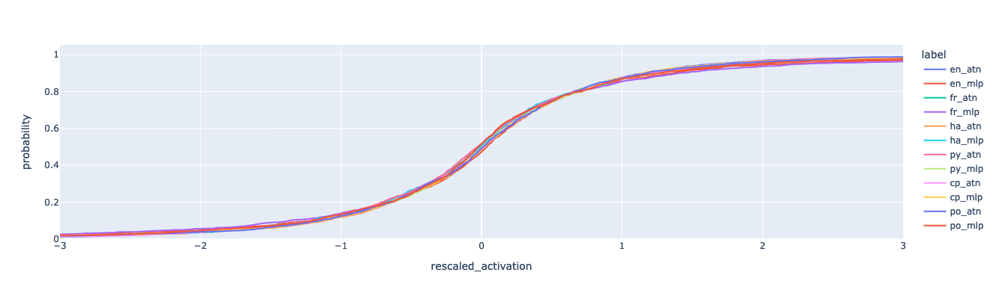

In [14]:
nsamples = 2000
df = u.arrays_to_labelled_df(
    {
        f"{c}_{t}": u.rescale_interquartile(u.sample_from_tensor(cacts1[c][i], nsamples))
        for c in keys
        for i, t in enumerate(["atn", "mlp"])
    },
    "rescaled_activation",
)
px.ecdf(df, x="rescaled_activation", color="label").update_layout(xaxis_range=[-3, 3], height=400)

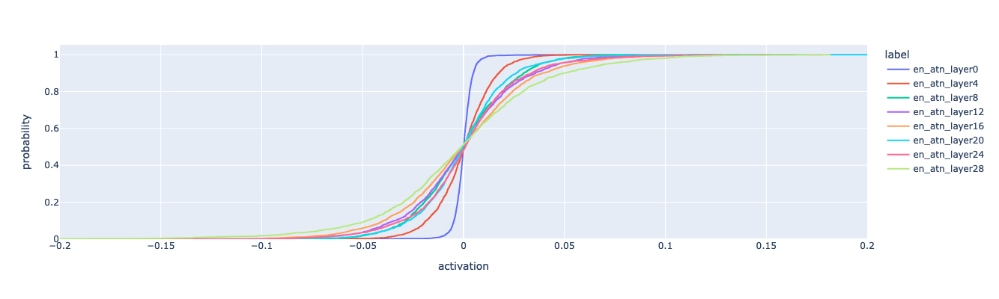

In [10]:
nsamples = 2000
df = u.arrays_to_labelled_df(
    {
        f"en_atn_layer{i}": u.sample_from_tensor(cacts1[keys[0]][0, i], nsamples)
        for i in range(0, 32, 4)
    },
    "activation",
)
px.ecdf(df, x="activation", color="label").update_layout(xaxis_range=[-0.2, 0.2], height=400)

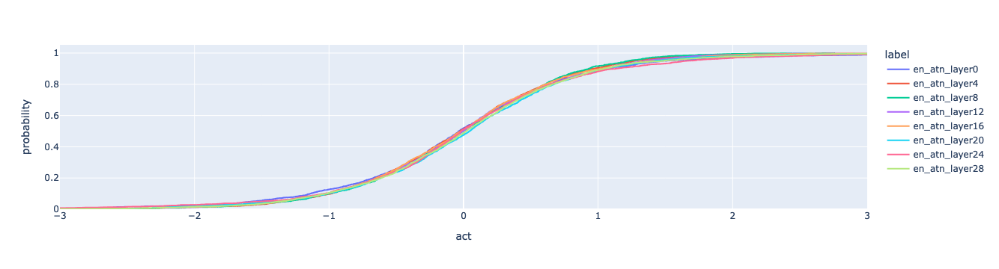

In [13]:
nsamples = 2000
df = u.arrays_to_labelled_df(
    {
        f"en_atn_layer{i}": u.rescale_interquartile(
            u.sample_from_tensor(cacts1[keys[0]][0, i], nsamples)
        )
        for i in range(0, 32, 4)
    },
    "act",
)
px.ecdf(df, x="act", color="label").update_layout(xaxis_range=[-3, 3])

In [15]:
iqds = {k: u.interquart(cacts1[k].reshape(2, 32, -1)[:, :, ::3], dim=2) for k in keys}

In [16]:
iqd_df = (
    pd.DataFrame(
        {(t, key): iqds[key][tind] for key in keys for tind, t in enumerate(["atn", "mlp"])}
    )
    .unstack()
    .rename("interquartile_distance")
)
iqd_df.index.names = ["type", "dataset", "layer"]

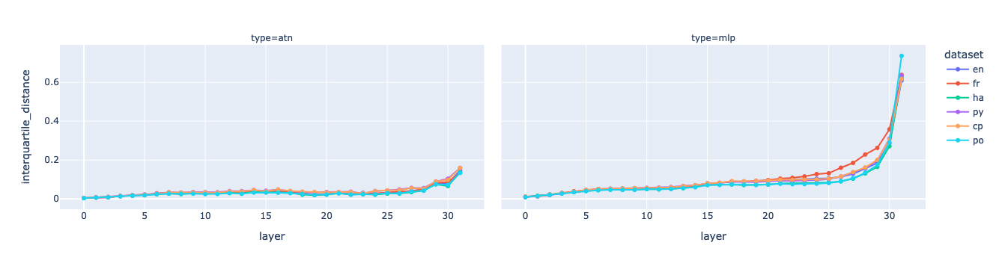

In [17]:
px.line(
    iqd_df.reset_index(),
    x="layer",
    y="interquartile_distance",
    color="dataset",
    facet_col="type",
    markers=True,
)

# Single sentence "mri"

In [20]:
key = "en"
sentence, acts = loaders[key].get_sentence_activations(0)
sentence

'A $26 million senior center is being built on Highway 80. Homeowners are remodeling their homes and are determined to stay.'

In [19]:
import record_activations as ra

/Users/fabio/.pyenv/versions/3.11.7/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [23]:
tokens = [
    "<|begin_of_text|>",
    *(s[1:] if s[0] == "Ġ" else s for s in ra.tokenizer.tokenize(sentence)),
]
tokens

['<|begin_of_text|>',
 'A',
 '$',
 '26',
 'million',
 'senior',
 'center',
 'is',
 'being',
 'built',
 'on',
 'Highway',
 '',
 '80',
 '.',
 'Home',
 'owners',
 'are',
 'remodeling',
 'their',
 'homes',
 'and',
 'are',
 'determined',
 'to',
 'stay',
 '.']

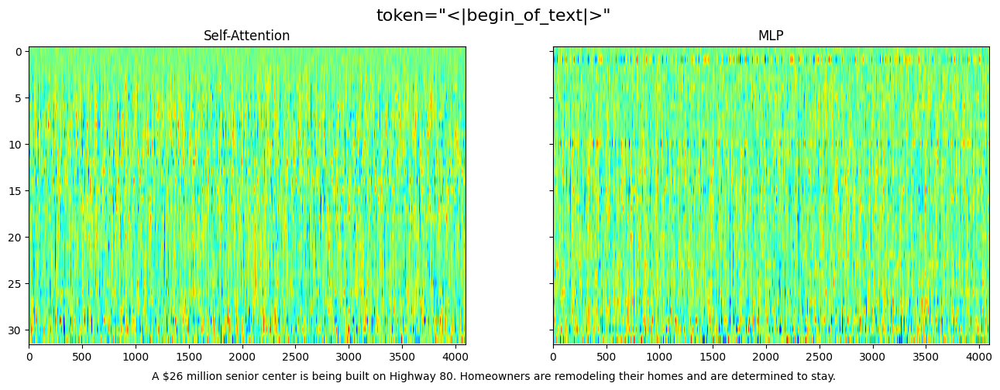

In [24]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
i = 0
suptitle = fig.suptitle('token="%s"', fontsize=16)
axs[0].set_title("Self-Attention")
axs[1].set_title("MLP")
fig.text(0.5, 0.025, sentence, ha="center", va="center")


def get_frame(i):
    acts_frame = acts[:, :, i, :]
    im0 = axs[0].imshow(u.tranks(acts_frame[0]), cmap="jet", aspect="auto")
    im1 = axs[1].imshow(u.tranks(acts_frame[1]), cmap="jet", aspect="auto")
    suptitle.set_text('token="%s"' % tokens[i])
    return (im0, im1, suptitle)


ani = animation.FuncAnimation(
    fig, get_frame, frames=len(tokens), blit=False, interval=1000, repeat_delay=5000
)

In [25]:
ani.save("mri_animation.mp4")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


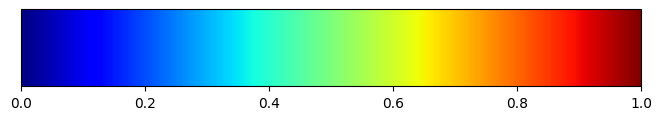

In [26]:
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable

# Choose your desired colormap
cmap = plt.get_cmap("jet")

# Create a figure and axis for the horizontal legend
fig, ax = plt.subplots(figsize=(8, 1))

# Create the colorbar
norm = plt.Normalize(vmin=0, vmax=1)
sm = ScalarMappable(cmap=cmap, norm=norm)
cb = fig.colorbar(sm, cax=ax, orientation="horizontal")

# Set labels and title (optional)
# cb.set_label('Value')
# ax.set_title('Colormap Legend')

plt.show()

# 2d reductions

In [28]:
means = {k: cacts1[k].mean(dim=2) for k in tqdm(keys)}
absmeans = {k: cacts1[k].abs().mean(dim=2) for k in tqdm(keys)}
# stds = {k: cacts1[k].std(dim=2) for k in tqdm(keys)}

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [29]:
means_1d = {k: means[k].mean(dim=2) for k in tqdm(keys)}
absmean_1d = {k: absmeans[k].mean(dim=2) for k in tqdm(keys)}

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

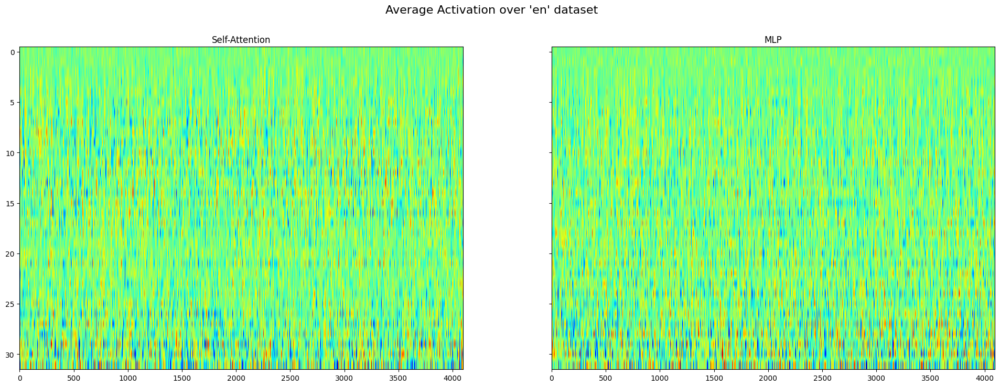

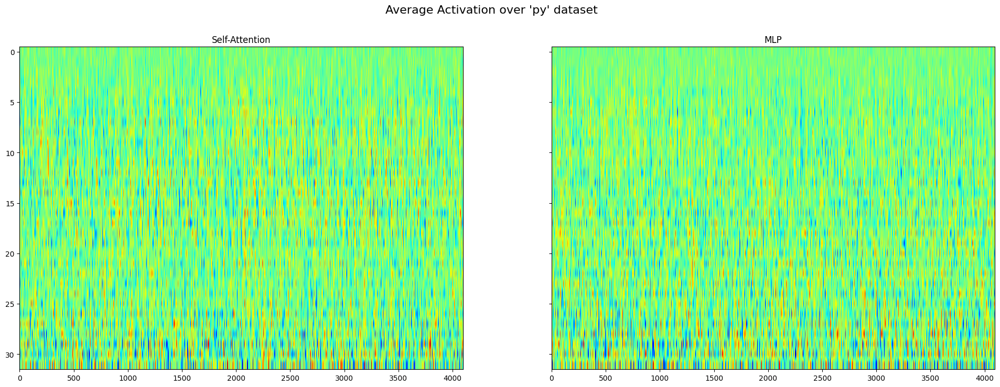

In [32]:
for key in ["en", "py"]:
    fig = u.tshow(means[key], f"Average Activation over '{key}' dataset")
    fig.savefig(f"avg_act_{key}.png")

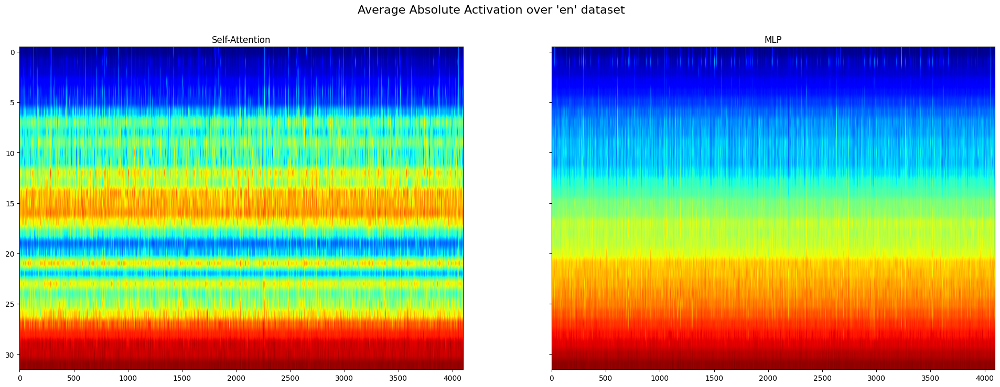

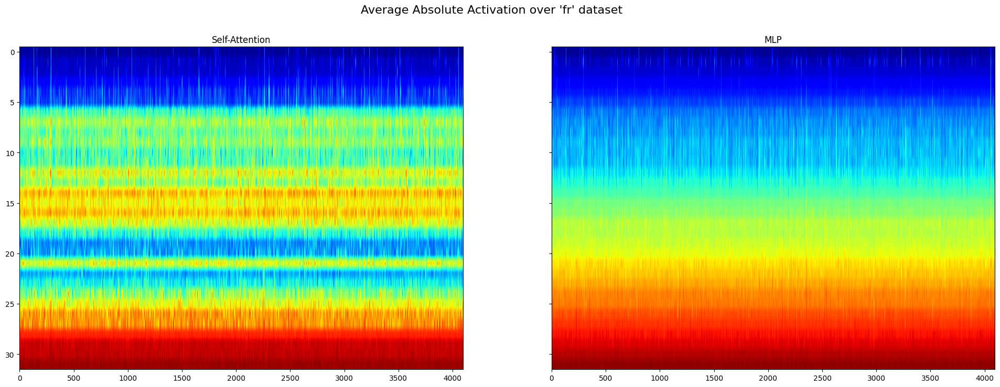

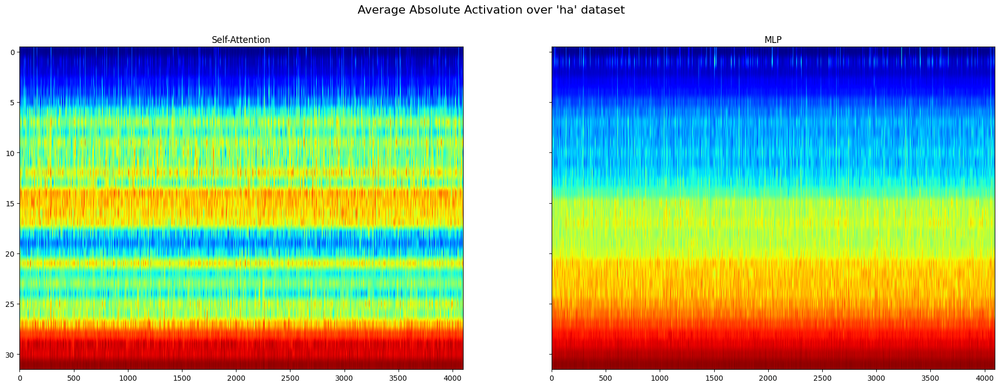

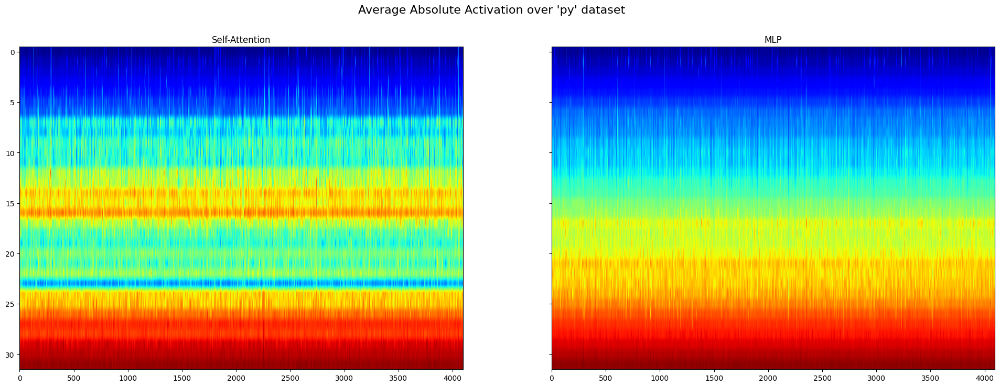

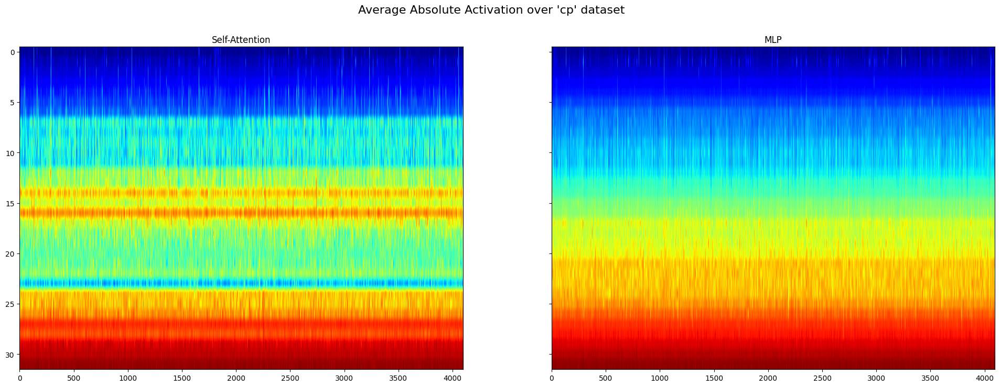

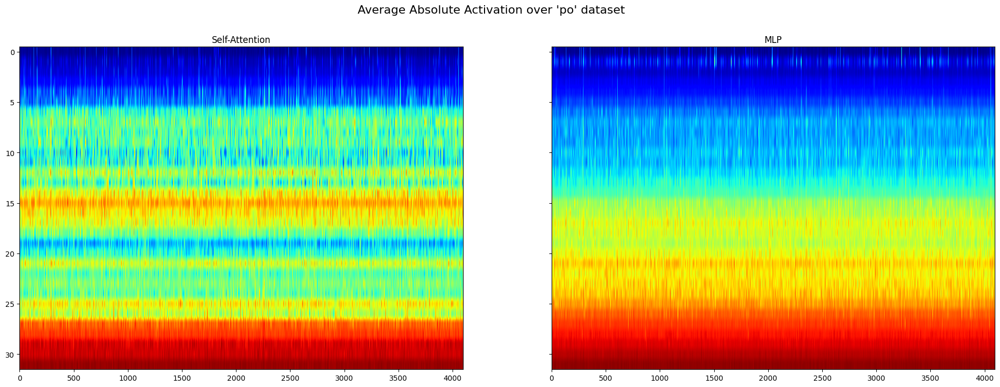

In [33]:
for key in keys:
    fig = u.tshow(absmeans[key], f"Average Absolute Activation over '{key}' dataset")
    fig.savefig(f"avg_abs_act_{key}.png")

# 1d reductions

In [34]:
def get_layer_1d_data(key, ind):
    _, acts = loaders[key].get_sentence_activations(ind)
    t = acts.abs().reshape(2, 32, -1).mean(dim=2)
    return t


def get_layer_1d_data_agg(key, inds):
    return torch.stack(tuple(get_layer_1d_data(key, ind) for ind in inds)).mean(dim=0)


def get_layer_1d_data_agg_df(key, inds):
    t = get_layer_1d_data_agg(key, inds)
    xs = pd.DataFrame({"atn": t[0], "mlp": t[1]}).unstack()
    xs.index.names = ("type", "layer")
    return xs.rename(key)


def get_layer1d_df(inds):
    df = pd.DataFrame({key: get_layer_1d_data_agg_df(key, inds) for key in tqdm(keys)})
    df.columns.name = "dataset"
    return df.stack().rename("mean_abs_act")

In [36]:
df1 = get_layer1d_df(range(100))
df2 = get_layer1d_df(range(100, 200))

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

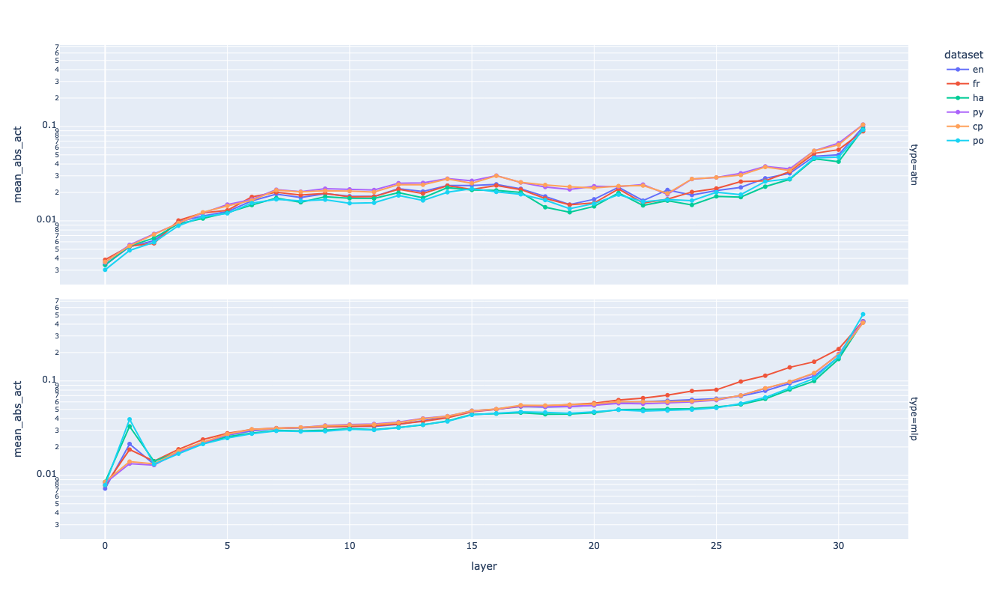

In [154]:
fig = px.line(
    df1.reset_index(),
    x="layer",
    y="mean_abs_act",
    facet_row="type",
    color="dataset",
    markers=True,
    log_y=True,
).update_layout(height=800, width=1200)
fig.show()
fig.write_image("mean_abs_act_1d_all.png")

In [56]:
norm_1d = df1.groupby(["type", "layer"]).mean()
df1_dev = df1 / norm_1d - 1
df2_dev = df2 / norm_1d - 1

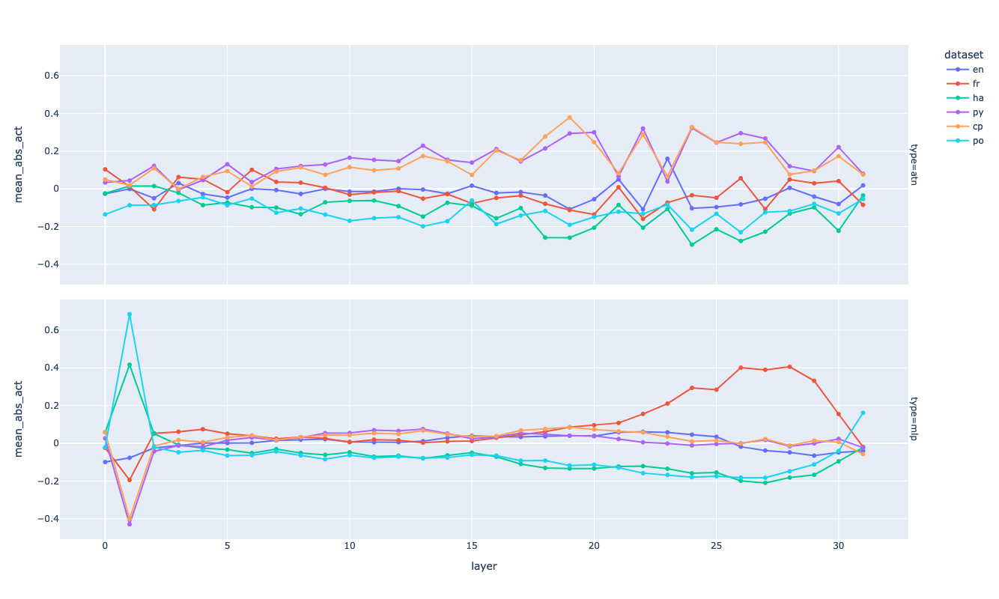

In [155]:
fig = px.line(
    df1_dev.reset_index(),
    x="layer",
    y="mean_abs_act",
    facet_row="type",
    color="dataset",
    markers=True,
).update_layout(height=800, width=1200)
fig.show()
fig.write_image("mean_abs_act_1d_all_rel.png")

In [60]:
df_dev = (
    pd.concat([df1_dev.to_frame().assign(subset="A"), df2_dev.to_frame().assign(subset="B")])
    .set_index("subset", append=True)
    .reset_index()
)
df_dev["datasetX"] = df_dev.dataset + df_dev.subset

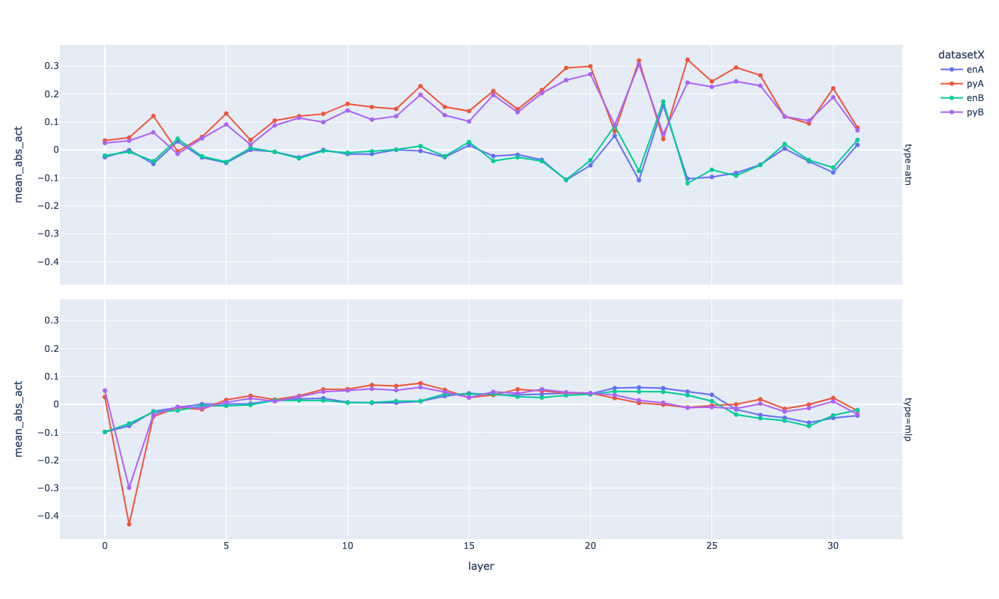

In [156]:
fig = px.line(
    df_dev[df_dev.dataset.isin(["en", "py"])],
    x="layer",
    y="mean_abs_act",
    facet_row="type",
    color="datasetX",
    markers=True,
).update_layout(height=800, width=1200)
fig.show()
fig.write_image("mean_abs_act_1d_comp.png")

In [157]:
def l1_dist(xs, ys):
    return (xs - ys).abs().mean()

In [158]:
dist_df = pd.DataFrame(
    {key2: [l1_dist(df1.loc[:, :, key1], df2.loc[:, :, key2]) for key1 in keys] for key2 in keys}
)
dist_df.index = keys

In [149]:
styled_dist_df = (
    (dist_df * 1000)
    .style.background_gradient(cmap="jet")
    .set_properties(**{"font-size": "18pt", "font-weight": "bold"})
    .set_table_styles(
        [
            {
                "selector": "th",
                "props": [("font-size", "18pt"), ("font-weight", "bold")],
            },  # Header (th) styles
            {
                "selector": ".index_name",
                "props": [("font-size", "12pt"), ("font-style", "italic")],
            },  # Index name styles
        ]
    )
    .format(precision=2)
)
styled_dist_df

,en,fr,ha,py,cp,po
en,0.51,4.98,4.17,2.85,3.24,5.36
fr,5.10,0.34,8.24,6.15,6.08,9.26
ha,4.30,8.26,0.35,6.67,7.37,2.64
py,3.24,6.39,6.71,0.63,0.90,7.86
cp,3.21,6.19,6.97,0.86,0.38,8.14
po,5.22,9.12,2.65,7.67,8.37,0.29


In [161]:
print(styled_dist_df.to_html())

<style type="text/css">
#T_bb713 th {
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713 .index_name {
  font-size: 12pt;
  font-style: italic;
}
#T_bb713_row0_col0, #T_bb713_row1_col1, #T_bb713_row2_col2, #T_bb713_row3_col3, #T_bb713_row4_col4, #T_bb713_row5_col5 {
  background-color: #000080;
  color: #f1f1f1;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row0_col1 {
  background-color: #94ff63;
  color: #000000;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row0_col2 {
  background-color: #6dff8a;
  color: #000000;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row0_col3 {
  background-color: #00c0ff;
  color: #000000;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row0_col4 {
  background-color: #06ecf1;
  color: #000000;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row0_col5 {
  background-color: #b1ff46;
  color: #000000;
  font-size: 18pt;
  font-weight: bold;
}
#T_bb713_row1_col0 {
  background-color: #9b0000;
  color: #f1f1f1;
  font-size: 18pt;
  font-

In [113]:
def get_pred_freq(key_ind, inds, dist_func=l1_dist):
    key = keys[key_ind]
    l = []
    for ind in inds:
        xs = get_layer_1d_data_agg_df(key, [ind])
        #        dists = np.array([dist_func(df1.loc[:, :, key], xs) for key in keys])
        #        l.append(dists)
        ans = np.argmin([dist_func(df1.loc[:, :, key], xs) for key in keys])
        l.append(ans)
    return pd.Series(l).value_counts(normalize=True)

In [116]:
freq_mat = pd.DataFrame(
    [
        get_pred_freq(key_ind, range(100, 200), dist_func=l1_dist)
        for key_ind, key in enumerate(keys)
    ],
    index=keys,
).fillna(0)[
    range(len(keys))
]  # we reorder the keys to be in numerical order
freq_mat.columns = keys

In [150]:
ts = freq_mat.to_numpy()
np.diag(ts).mean()

0.795

In [151]:
freq_mat.axes[0].name = "Actual"
freq_mat.axes[1].name = "Predicted"
styled_freq_mat = (
    freq_mat.style.background_gradient(cmap="jet")
    .set_properties(**{"font-size": "18pt", "font-weight": "bold"})
    .set_table_styles(
        [
            {
                "selector": "th",
                "props": [("font-size", "18pt"), ("font-weight", "bold")],
            },  # Header (th) styles
            {
                "selector": ".index_name",
                "props": [("font-size", "12pt"), ("font-style", "italic")],
            },  # Index name styles
        ]
    )
    .format(precision=2)
)
styled_freq_mat

Predicted,en,fr,ha,py,cp,po
Actual,,,,,,
en,0.81,0.00,0.02,0.01,0.02,0.14
fr,0.00,0.96,0.00,0.00,0.00,0.04
ha,0.06,0.00,0.94,0.00,0.00,0.00
py,0.01,0.00,0.01,0.54,0.41,0.03
cp,0.01,0.00,0.00,0.39,0.60,0.00
po,0.03,0.00,0.04,0.01,0.00,0.92


In [162]:
print(styled_freq_mat.to_html())

<style type="text/css">
#T_c95bb th {
  font-size: 18pt;
  font-weight: bold;
}
#T_c95bb .index_name {
  font-size: 12pt;
  font-style: italic;
}
#T_c95bb_row0_col0, #T_c95bb_row1_col1, #T_c95bb_row2_col2, #T_c95bb_row3_col3, #T_c95bb_row4_col4, #T_c95bb_row5_col5 {
  background-color: #800000;
  color: #f1f1f1;
  font-size: 18pt;
  font-weight: bold;
}
#T_c95bb_row0_col1, #T_c95bb_row1_col0, #T_c95bb_row1_col2, #T_c95bb_row1_col3, #T_c95bb_row1_col4, #T_c95bb_row2_col1, #T_c95bb_row2_col3, #T_c95bb_row2_col4, #T_c95bb_row2_col5, #T_c95bb_row3_col1, #T_c95bb_row4_col1, #T_c95bb_row4_col2, #T_c95bb_row4_col5, #T_c95bb_row5_col1, #T_c95bb_row5_col4 {
  background-color: #000080;
  color: #f1f1f1;
  font-size: 18pt;
  font-weight: bold;
}
#T_c95bb_row0_col2 {
  background-color: #000096;
  color: #f1f1f1;
  font-size: 18pt;
  font-weight: bold;
}
#T_c95bb_row0_col3, #T_c95bb_row5_col3 {
  background-color: #000092;
  color: #f1f1f1;
  font-size: 18pt;
  font-weight: bold;
}
#T_c95bb_row0_